In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import datetime as dt
import glob
import numpy as np
import cartopy.crs as ccrs
import metpy.calc as mpcalc
import metpy.units as units
from scipy.ndimage import uniform_filter

In [2]:
def get_z500(time,lon,lat,domain):
    lon1, lat1, lon2, lat2 = domain
    fz=xr.open_dataset(glob.glob("/g/data/rt52/era5/pressure-levels/reanalysis/z/"+time.strftime("%Y")+"/z_era5_oper_pl_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0), "level":500}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)}).z / 9.8
    return fz

def get_thetae_850(time,lon,lat,domain):
    lon1, lat1, lon2, lat2 = domain
    fq=xr.open_dataset(glob.glob("/g/data/rt52/era5/pressure-levels/reanalysis/q/"+time.strftime("%Y")+"/q_era5_oper_pl_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0), "level":850}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)}).q  
    ft=xr.open_dataset(glob.glob("/g/data/rt52/era5/pressure-levels/reanalysis/t/"+time.strftime("%Y")+"/t_era5_oper_pl_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0), "level":850}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)}).t        
    ta_unit = units.units.K*ft.values
    dp_unit = mpcalc.dewpoint_from_specific_humidity(850 * units.units.hectopascals, ta_unit, fq.values*units.units.dimensionless)    
    thetae = uniform_filter(np.array(mpcalc.equivalent_potential_temperature(850 * units.units.hectopascals, ta_unit, dp_unit)),size=4)
    x,y = np.meshgrid(ft.longitude.values, ft.latitude.values)
    dx, dy = mpcalc.lat_lon_grid_deltas(x,y)
    ddy_thetae = mpcalc.first_derivative( thetae, delta=dy, axis=0)
    ddx_thetae = mpcalc.first_derivative( thetae, delta=dx, axis=1)
    mag_thetae = np.sqrt( ddx_thetae**2 + ddy_thetae**2)    
    
    return x,y,thetae,mag_thetae.to("km^-1")*100

def plot_mslp(time,ax,lon,lat,domain,cbar=False):
    #lon1 = 112; lat1 = -44.5; lon2 = 156.5; lat2 = -10
    lon1, lat1, lon2, lat2 = domain

    f = xr.open_dataset(glob.glob("/g/data/eg3/ab4502/ExtremeWind/aus/era5/era5_"\
                            +time.strftime("%Y%m")+"*.nc")[0]).sel({"time":time.replace(minute=0)})
    f=f.sel({"lon":slice(lon1,lon2), "lat":slice(lat2,lat1)})

    f2=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/msl/"+time.strftime("%Y")+"/msl_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                       .sel({"time":time.replace(minute=0)})
    f2=f2.sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)}).rolling({"latitude":4, "longitude":4}).mean()
    
    fu=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10u/"+time.strftime("%Y")+"/10u_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})
    fv=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10v/"+time.strftime("%Y")+"/10v_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})

    x,y,thetae,mag_thetae = get_thetae_850(time, lon, lat, domain)
    x,y = np.meshgrid(fu.longitude, fu.latitude)
    c=ax.contourf(x,y,thetae, levels=np.arange(290,355,5),cmap=plt.get_cmap("YlGnBu"), extend="both")    
    ax.contour(x,y,thetae, levels=np.arange(290,355,5),colors="k",linewidths=0.5,alpha=0.5)    
    cont=xr.plot.contour(f2["msl"]/100, levels=np.arange(980,1044,2),add_labels=False, colors=["k"], ax=ax, linewidths=2)
    labs = plt.clabel(cont, np.arange(980,1044,4))
    plt.title(time)
    if cbar:
        cx=plt.axes([0.2,0.07,0.6,0.02])
        cb=plt.colorbar(c,cax=cx,orientation="horizontal")
        cb.set_label("850 hPa equivalent potential temperature (K)")
    ax.coastlines(color="white",lw=2,alpha=1)
    
    #x,y = np.meshgrid(fu.longitude.values, fv.latitude.values)
    #xr.Dataset({"u":fu["u10"], "v":fv["v10"]}).coarsen({"latitude":5, "longitude":5},boundary="trim").mean().plot.quiver(
    #    x="longitude",y="latitude",u="u",v="v",ax=ax)
    
    ax.plot(lon,lat,ms=20,marker="*",mec="k",color="tab:red")
    
    g=ax.gridlines(draw_labels=True)
    g.top_labels=False
    g.right_labels=False

def plot_z(time,ax,lon,lat,domain,cbar=False):
    #lon1 = 112; lat1 = -44.5; lon2 = 156.5; lat2 = -10
    lon1, lat1, lon2, lat2 = domain

    f = xr.open_dataset(glob.glob("/g/data/eg3/ab4502/ExtremeWind/aus/era5/era5_"\
                            +time.strftime("%Y%m")+"*.nc")[0]).sel({"time":time.replace(minute=0)})
    f=f.sel({"lon":slice(lon1,lon2), "lat":slice(lat2,lat1)})

    f2=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/msl/"+time.strftime("%Y")+"/msl_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                       .sel({"time":time.replace(minute=0)})
    f2=f2.sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)}).rolling({"latitude":4, "longitude":4}).mean()
    
    fu=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10u/"+time.strftime("%Y")+"/10u_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})
    fv=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10v/"+time.strftime("%Y")+"/10v_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})

    z = get_z500(time,lon,lat,domain)
    x,y = np.meshgrid(fu.longitude, fu.latitude)
    c=ax.contourf(x,y,z,levels=np.arange(5200,6050,50),cmap=plt.get_cmap("Blues"), extend="both")
    ax.contour(x,y,z,levels=np.arange(5200,6150,50),colors="k",alpha=0.5,linewidths=1)    
    cont=xr.plot.contour(f2["msl"]/100, levels=np.arange(980,1044,2),add_labels=False, colors=["k"], ax=ax, linewidths=2)    
    labs = plt.clabel(cont, np.arange(980,1044,4))
    plt.title(time)
    if cbar:
        cx=plt.axes([0.2,0.07,0.6,0.02])
        cb=plt.colorbar(c,cax=cx,orientation="horizontal")
        cb.set_label("500 hPa geopotential height (m)")
    ax.coastlines(color="white",lw=2,alpha=1)
    
    x,y = np.meshgrid(fu.longitude.values, fv.latitude.values)
    q = xr.Dataset({"u":fu["u10"], "v":fv["v10"]}).coarsen({"latitude":5, "longitude":5},boundary="trim").mean().plot.quiver(
        x="longitude",y="latitude",u="u",v="v",ax=ax,add_guide=False)
    ax.quiverkey(q,1,1.02,10,"10 m/s")
    
    ax.plot(lon,lat,ms=20,marker="*",mec="k",color="tab:red")
    
    g=ax.gridlines(draw_labels=True)
    g.top_labels=False
    g.right_labels=False

/jobfs/31581099.gadi-pbs/ipykernel_301230/3167917931.py:25: MatplotlibDeprecationWarning: 
The 'quality' parameter of print_jpg() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use pil_kwargs={'quality': ...} instead. If any parameter follows 'quality', they should be passed as keyword, not positionally.
  plt.savefig("/g/data/eg3/ab4502/figs/ExtremeWind/case_studies/melb_thetae.jpeg",bbox_inches="tight",quality=100)
/jobfs/31581099.gadi-pbs/ipykernel_301230/3167917931.py:36: MatplotlibDeprecationWarning: 
The 'quality' parameter of print_jpg() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use pil_kwargs={'quality': ...} instead. If any parameter follows 'quality', they should be passed as keyword, not positionally.
  plt.savefig("/g/data/eg3/ab4502/figs/ExtremeWind/case_studies/melb_z.jpeg",bbox_inches="tight",quality=100)


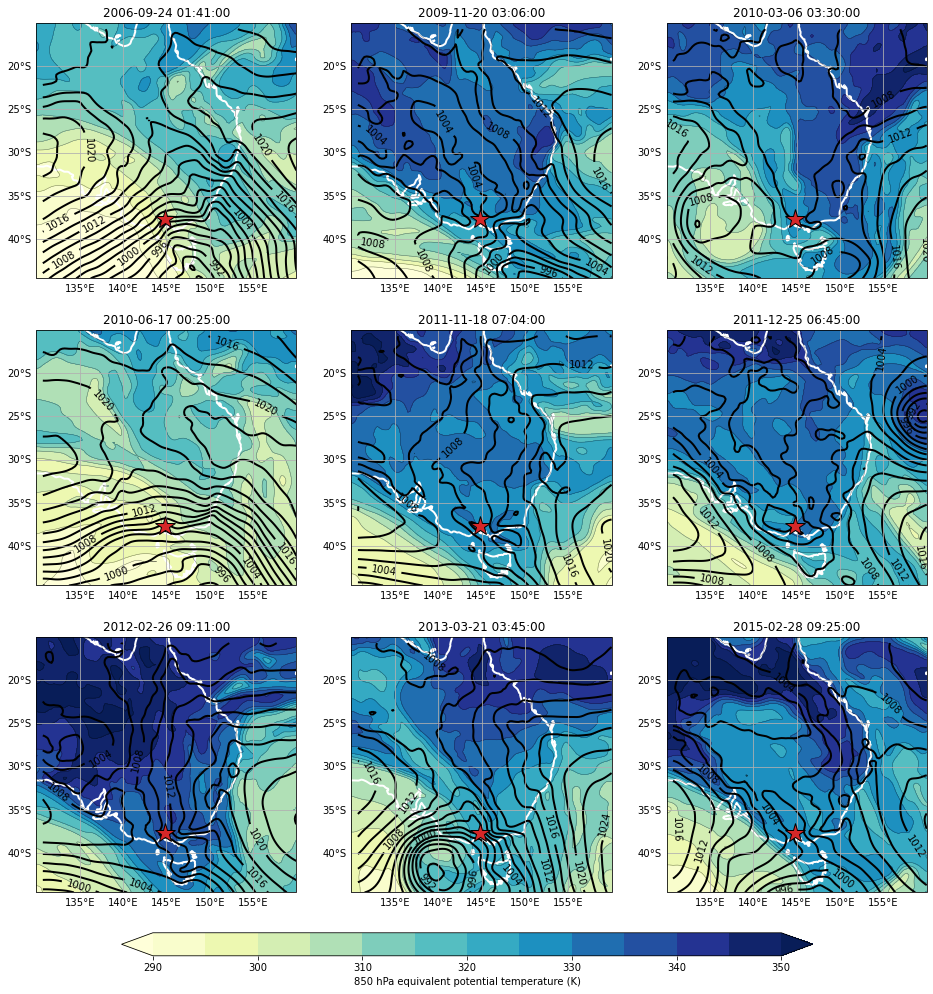

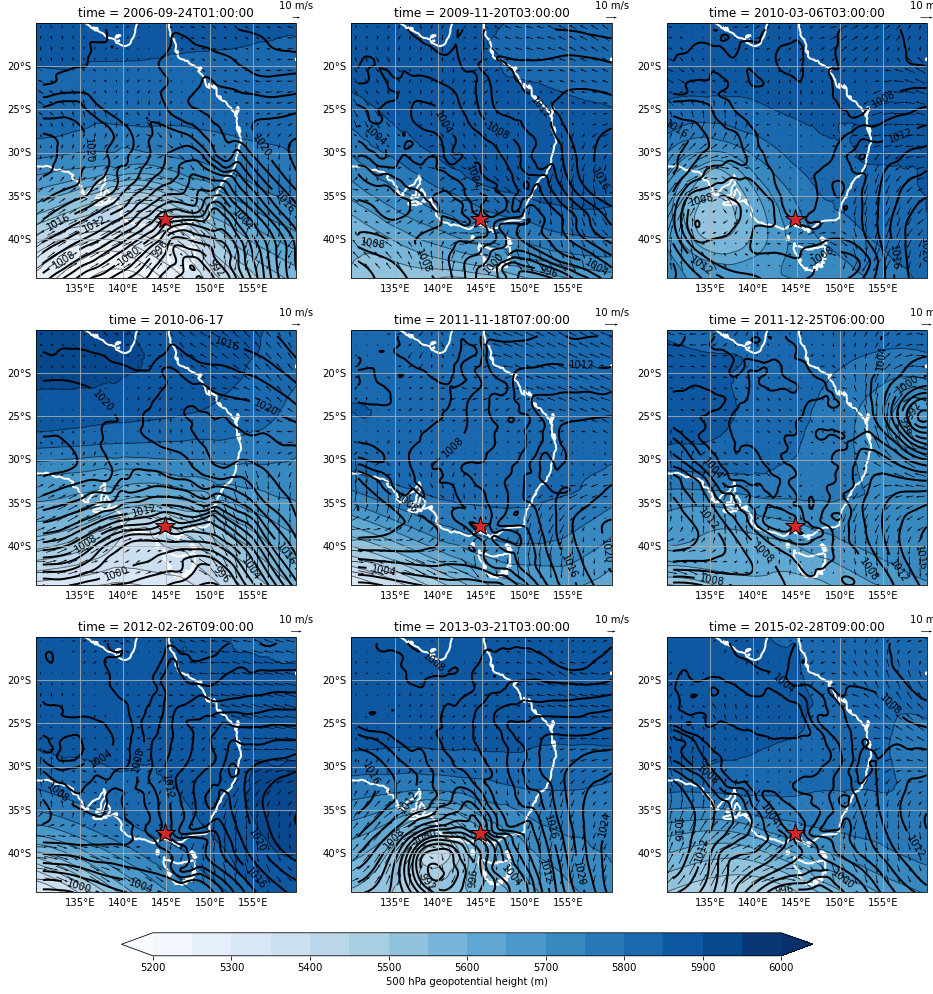

In [10]:
lon1 = 130; lat1 = -44.5; lon2 = 160; lat2 = -15
domain = [lon1,lat1,lon2,lat2]

dets = [\
        {"lat":-37.6654, "lon":144.8322, "time" : [dt.datetime(2006,9,24,1,41)], "rid":"2", "title":"a) "},\
        {"lat":-37.6654, "lon":144.8322, "time" : [dt.datetime(2009,11,20,3,6)], "rid":"2", "title":"b) "},\
        {"lat":-37.6654, "lon":144.8322, "time" : [dt.datetime(2010,3,6,3,30)], "rid":"2", "title":"c) "},\
        {"lat":-37.6654, "lon":144.8322, "time" : [dt.datetime(2010,6,17,0,25)], "rid":"2", "title":"d) "},\
        {"lat":-37.6654, "lon":144.8322, "time" : [dt.datetime(2011,11,18,7,4)], "rid":"2", "title":"e) "},\
        {"lat":-37.6654, "lon":144.8322, "time" : [dt.datetime(2011,12,25,6,45)], "rid":"2", "title":"f) "},\
        {"lat":-37.6654, "lon":144.8322, "time" : [dt.datetime(2012,2,26,9,11)], "rid":"2", "title":"g) "},\
        {"lat":-37.6654, "lon":144.8322, "time" : [dt.datetime(2013,3,21,3,45)], "rid":"2", "title":"h) "},\
        {"lat":-37.6654, "lon":144.8322, "time" : [dt.datetime(2015,2,28,9,25)], "rid":"2", "title":"i) "},\
       ]

plt.figure(figsize=[16,16])
cnt=1
for t in dets:
    ax=plt.subplot(3,3,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_mslp(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_mslp(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1
plt.savefig("/g/data/eg3/ab4502/figs/ExtremeWind/case_studies/melb_thetae.jpeg",bbox_inches="tight",quality=100)
    
plt.figure(figsize=[16,16])
cnt=1
for t in dets:
    ax=plt.subplot(3,3,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_z(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_z(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1
plt.savefig("/g/data/eg3/ab4502/figs/ExtremeWind/case_studies/melb_z.jpeg",bbox_inches="tight",quality=100)

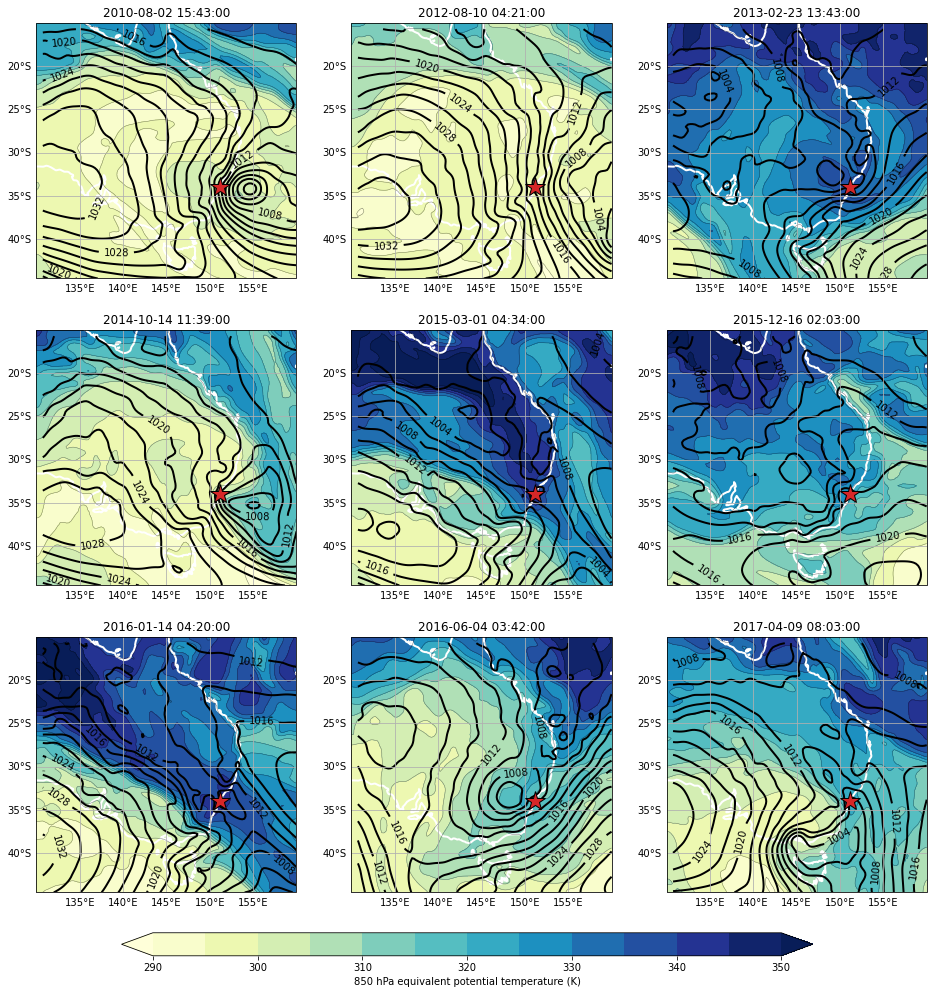

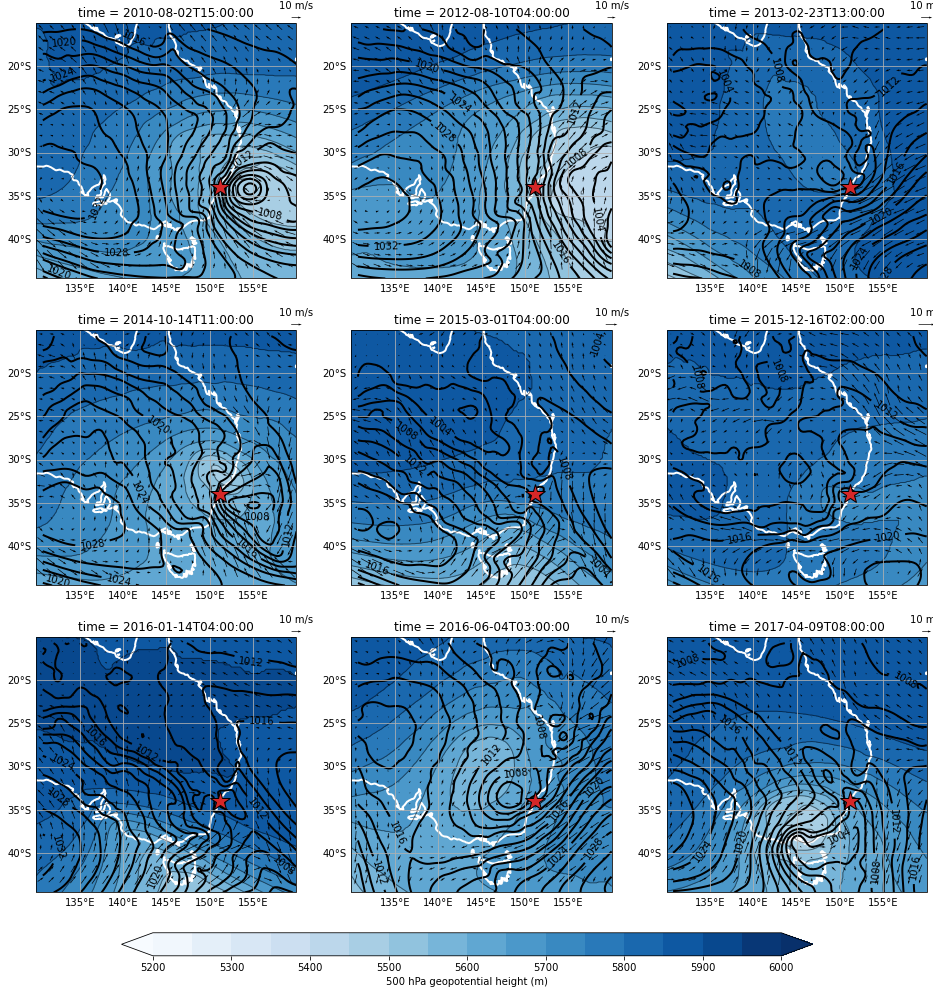

In [11]:
dets = [\
        {"lat":-33.9465, "lon":151.1731, "time" : [dt.datetime(2010,8,2,15,43)], "rid":"71", "title":"a) "},\
        {"lat":-33.9465, "lon":151.1731, "time" : [dt.datetime(2012,8,10,4,21)], "rid":"71", "title":"b) "},\
        {"lat":-33.9465, "lon":151.1731, "time" : [dt.datetime(2013,2,23,13,43)], "rid":"71", "title":"c) "},\
        {"lat":-33.9465, "lon":151.1731, "time" : [dt.datetime(2014,10,14,11,39)], "rid":"71", "title":"d) "},\
        {"lat":-33.9465, "lon":151.1731, "time" : [dt.datetime(2015,3,1,4,34)], "rid":"71", "title":"e) "},\
        {"lat":-33.9465, "lon":151.1731, "time" : [dt.datetime(2015,12,16,2,3)], "rid":"71", "title":"f) "},\
        {"lat":-33.9465, "lon":151.1731, "time" : [dt.datetime(2016,1,14,4,20)], "rid":"71", "title":"g) "},\
        {"lat":-33.9465, "lon":151.1731, "time" : [dt.datetime(2016,6,4,3,42)], "rid":"71", "title":"h) "},\
        {"lat":-33.9465, "lon":151.1731, "time" : [dt.datetime(2017,4,9,8,3)], "rid":"71", "title":"i) "},\
       ]

plt.figure(figsize=[16,16])
cnt=1
for t in dets:
    ax=plt.subplot(3,3,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_mslp(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_mslp(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1

plt.figure(figsize=[16,16])
cnt=1
for t in dets:
    ax=plt.subplot(3,3,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_z(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_z(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1

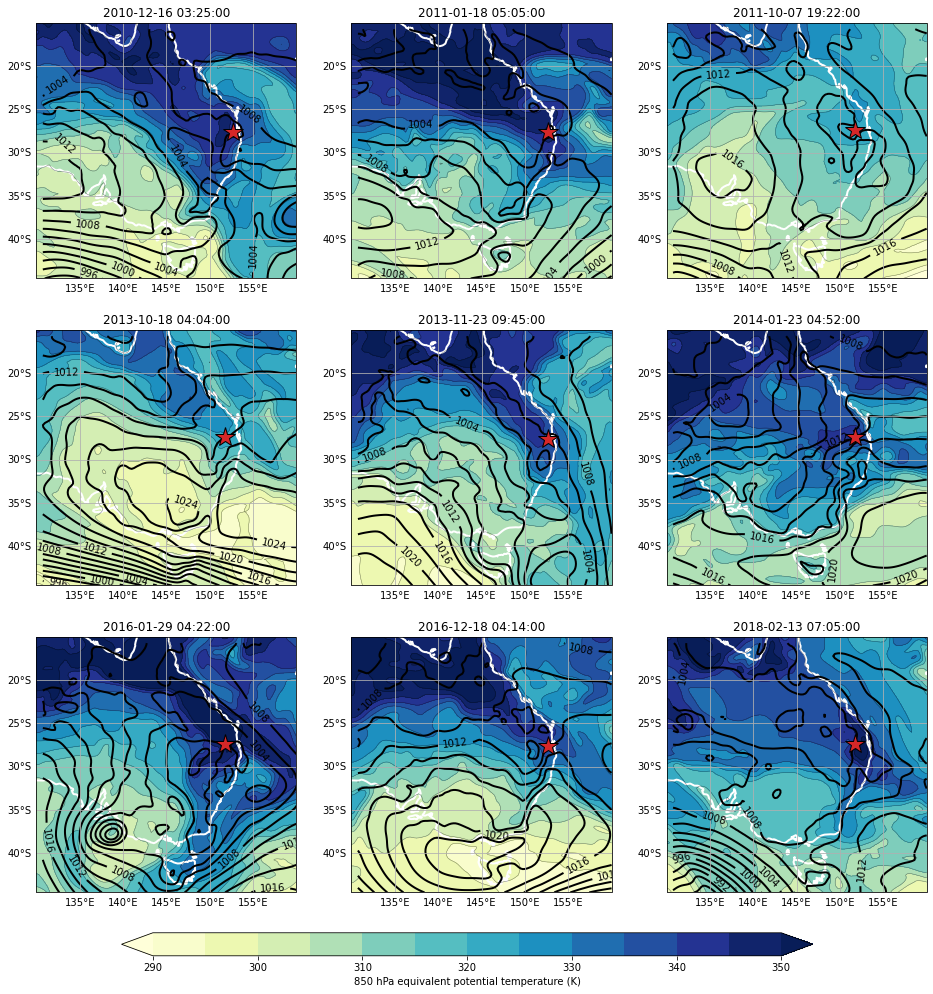

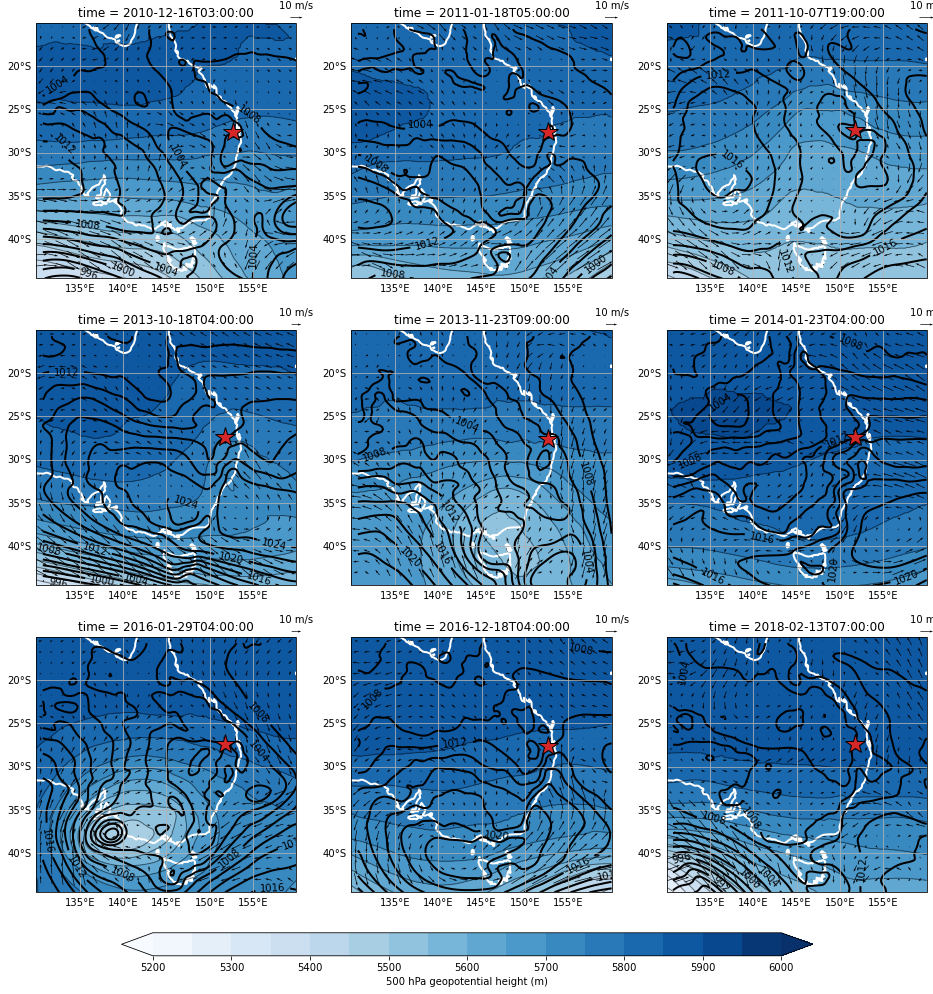

In [12]:
dets = [\
        {"lat":-27.6297, "lon":152.7111, "time" : [dt.datetime(2010,12,16,3,25)], "rid":"66", "title":"a) "},\
        {"lat":-27.6297, "lon":152.7111, "time" : [dt.datetime(2011,1,18,5,5)], "rid":"66", "title":"b) "},\
        {"lat":-27.4034, "lon":151.7413, "time" : [dt.datetime(2011,10,7,19,22)], "rid":"50", "title":"c) "},\
        {"lat":-27.4034, "lon":151.7413, "time" : [dt.datetime(2013,10,18,4,4)], "rid":"50", "title":"d) "},\
        {"lat":-27.6297, "lon":152.7111, "time" : [dt.datetime(2013,11,23,9,45)], "rid":"66", "title":"e) "},\
        {"lat":-27.4034, "lon":151.7413, "time" : [dt.datetime(2014,1,23,4,52)], "rid":"50", "title":"f) "},\
        {"lat":-27.4034, "lon":151.7413, "time" : [dt.datetime(2016,1,29,4,22)], "rid":"50", "title":"g) "},\
        {"lat":-27.6297, "lon":152.7111, "time" : [dt.datetime(2016,12,18,4,14)], "rid":"66", "title":"h) "},\
        {"lat":-27.4034, "lon":151.7413, "time" : [dt.datetime(2018,2,13,7,5)], "rid":"50", "title":"i) "},\
       ]

plt.figure(figsize=[16,16])
cnt=1
for t in dets:
    ax=plt.subplot(3,3,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_mslp(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_mslp(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1

plt.figure(figsize=[16,16])
cnt=1
for t in dets:
    ax=plt.subplot(3,3,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_z(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_z(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1

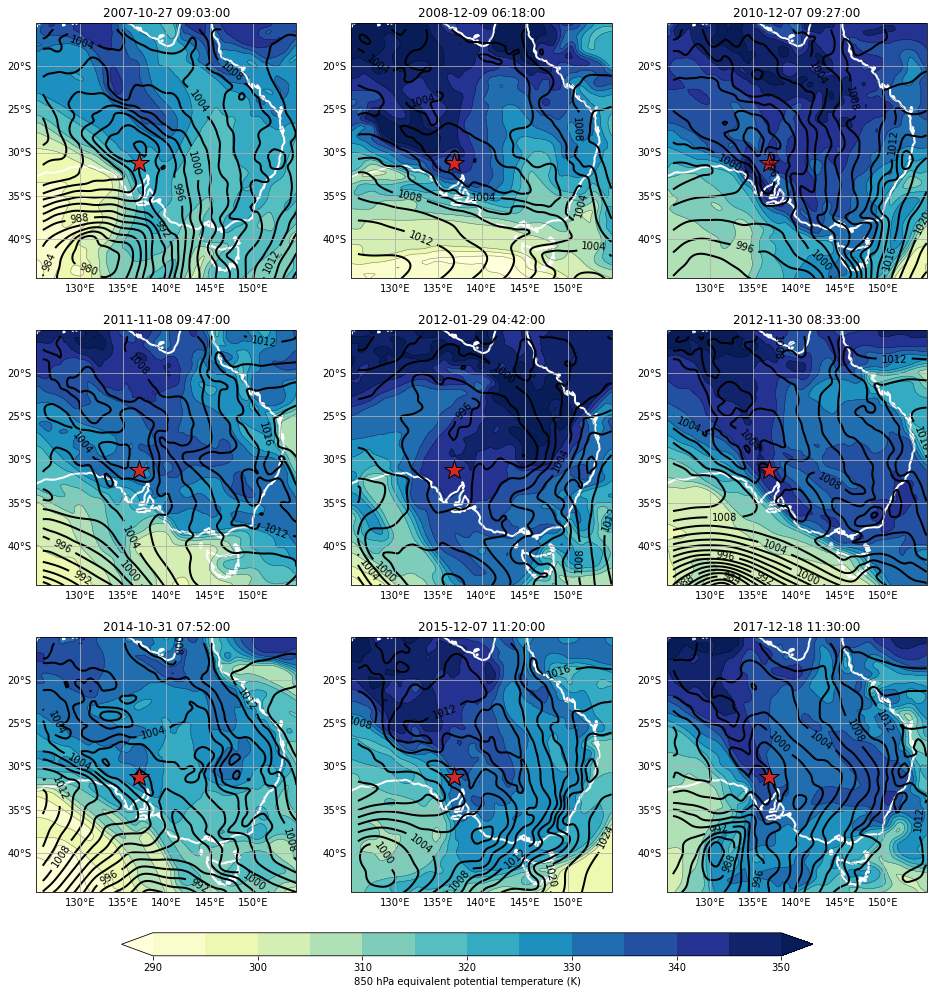

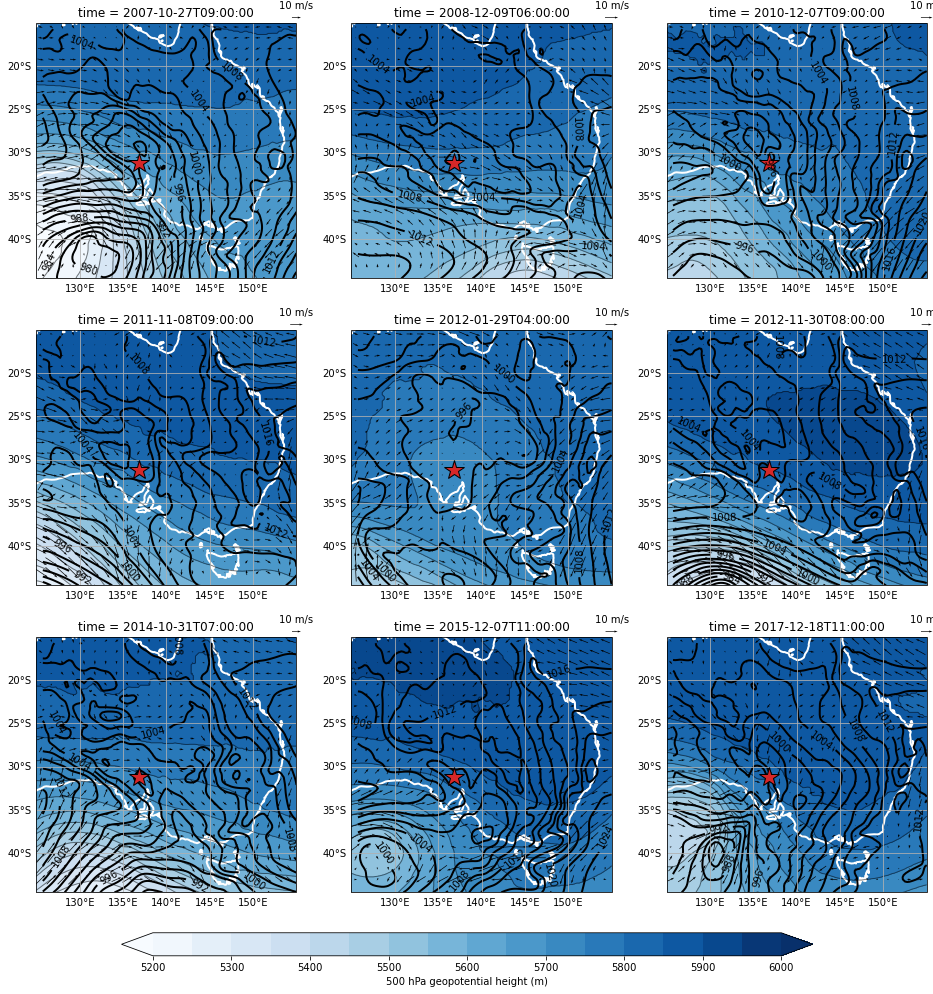

In [3]:
lon1 = 125; lat1 = -44.5; lon2 = 155; lat2 = -15
domain = [lon1,lat1,lon2,lat2]

dets = [\
        {"lat":-31.1558, "lon":136.8054, "time" : [dt.datetime(2007,10,27,9,3)], "rid":"27", "title":"a) "},\
        {"lat":-31.1558, "lon":136.8054, "time" : [dt.datetime(2008,12,9,6,18)], "rid":"27", "title":"b) "},\
        {"lat":-31.1558, "lon":136.8054, "time" : [dt.datetime(2010,12,7,9,27)], "rid":"27", "title":"c) "},\
        {"lat":-31.1558, "lon":136.8054, "time" : [dt.datetime(2011,11,8,9,47)], "rid":"27", "title":"e) "},\
        {"lat":-31.1558, "lon":136.8054, "time" : [dt.datetime(2012,1,29,4,42)], "rid":"27", "title":"f) "},\
        {"lat":-31.1558, "lon":136.8054, "time" : [dt.datetime(2012,11,30,8,33)], "rid":"27", "title":"g) "},\
        {"lat":-31.1558, "lon":136.8054, "time" : [dt.datetime(2014,10,31,7,52)], "rid":"27", "title":"h) "},\
        {"lat":-31.1558, "lon":136.8054, "time" : [dt.datetime(2015,12,7,11,20)], "rid":"27", "title":"i) "},\
        {"lat":-31.1558, "lon":136.8054, "time" : [dt.datetime(2017,12,18,11,30)], "rid":"27", "title":"i) "}
       ]

plt.figure(figsize=[16,16])
cnt=1
for t in dets:
    ax=plt.subplot(3,3,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_mslp(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_mslp(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1

plt.figure(figsize=[16,16])
cnt=1
for t in dets:
    ax=plt.subplot(3,3,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_z(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_z(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1

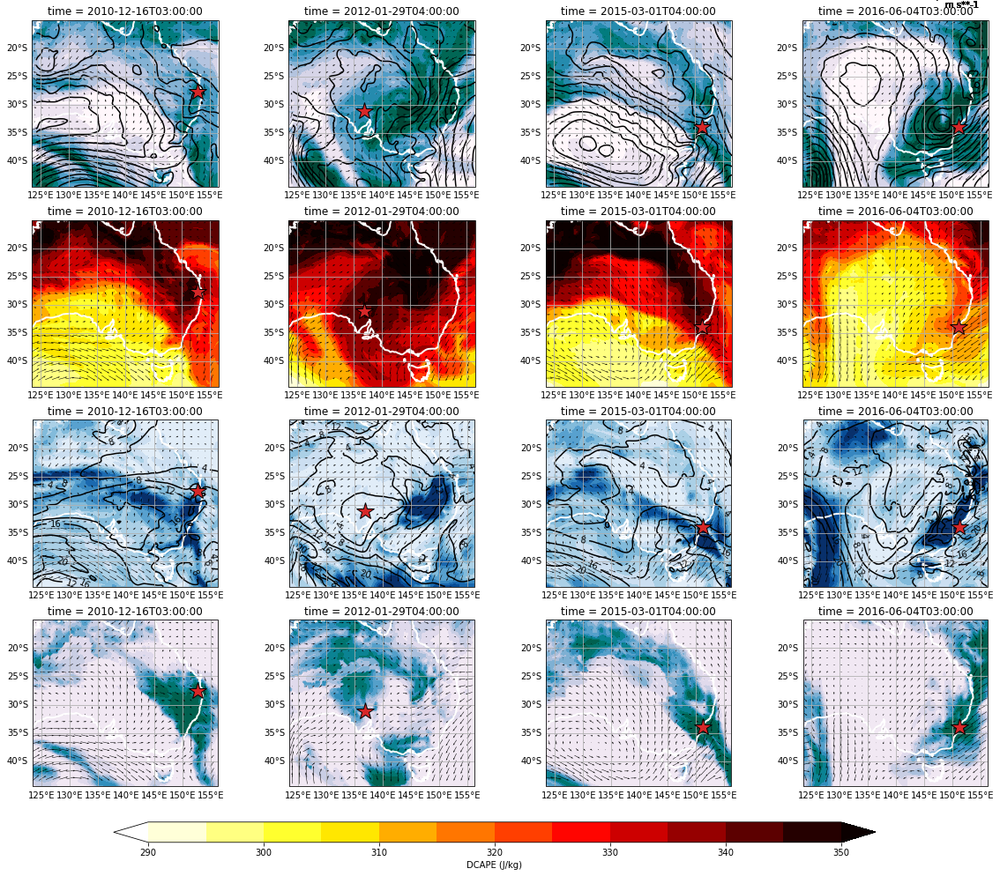

In [65]:
def calc_logit(ds):
    ds = ds.assign(logit_era5_aws = 1 / 
                   ( 1 + np.exp( -(6.1e-02*ds["ebwd"] + 1.5e-01*ds["Umean800_600"] + 9.4e-01*ds["lr13"] + 3.9e-02*ds["rhmin13"] +
                                   1.7e-02*ds["srhe_left"] +3.8e-01*ds["q_melting"] +4.7e-04*ds["eff_lcl"] - 1.3e+01 ) ) ) )
    return ds

def plot_rh(time,ax,lon,lat,domain,cbar=False):
    #lon1 = 112; lat1 = -44.5; lon2 = 156.5; lat2 = -10
    lon1, lat1, lon2, lat2 = domain

    f = xr.open_dataset(glob.glob("/g/data/eg3/ab4502/ExtremeWind/aus/era5/era5_"\
                            +time.strftime("%Y%m")+"*.nc")[0]).sel({"time":time.replace(minute=0)})
    f=f.sel({"lon":slice(lon1,lon2), "lat":slice(lat2,lat1)})

    f2=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/msl/"+time.strftime("%Y")+"/msl_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                       .sel({"time":time.replace(minute=0)})
    f2=f2.sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)}).rolling({"latitude":4, "longitude":4}).mean()
    
    fu=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10u/"+time.strftime("%Y")+"/10u_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})
    fv=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10v/"+time.strftime("%Y")+"/10v_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})

    c=xr.plot.contourf(f["rhmin13"], cmap=plt.get_cmap("PuBuGn"),levels=np.arange(0,110,10),add_labels=False,add_colorbar=False, ax=ax)
    xr.plot.contour(f2["msl"]/100, levels=np.arange(980,1044,2),add_labels=False, colors=["k"], ax=ax, linewidths=1.5)
    plt.title(time)
    if cbar:
        cx=plt.axes([0.2,0.07,0.6,0.02])
        cb=plt.colorbar(c,cax=cx,orientation="horizontal")
        cb.set_label("Precipitable water (mm)")
    ax.coastlines(color="white",lw=2,alpha=1)
    
    x,y = np.meshgrid(fu.longitude.values, fv.latitude.values)
    xr.Dataset({"u":fu["u10"], "v":fv["v10"]}).coarsen({"latitude":5, "longitude":5},boundary="trim").mean().plot.quiver(
        x="longitude",y="latitude",u="u",v="v",ax=ax)
    
    ax.plot(lon,lat,ms=20,marker="*",mec="k",color="tab:red")
    
    g=ax.gridlines(draw_labels=True)
    g.top_labels=False
    g.right_labels=False

    #print(f,f2,fu,fv)

def plot_temps(time,ax,lon,lat,domain,cbar=False):
    lon1, lat1, lon2, lat2 = domain

    f = xr.open_dataset(glob.glob("/g/data/eg3/ab4502/ExtremeWind/aus/era5/era5_"\
                            +time.strftime("%Y%m")+"*.nc")[0]).sel({"time":time.replace(minute=0)})
    f=f.sel({"lon":slice(lon1,lon2), "lat":slice(lat2,lat1)})

    f2=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/2t/"+time.strftime("%Y")+"/2t_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                       .sel({"time":time.replace(minute=0)})
    f2=f2.sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)}).rolling({"latitude":4, "longitude":4}).mean()
    
    fu=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10u/"+time.strftime("%Y")+"/10u_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})
    fv=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10v/"+time.strftime("%Y")+"/10v_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})

    c_levels = np.arange(4,8,1) 
    te = get_thetae_850(time, lon, lat, domain)
    x,y = np.meshgrid(fu.longitude, fu.latitude)
    #cont=xr.plot.contour(f["lr13"].rolling({"lat":4, "lon":4}).mean(), colors="k",levels=c_levels,add_labels=False,add_colorbar=False, ax=ax)
    #c=xr.plot.contourf(f2["t2m"] - 273.15, levels=np.arange(10,47.5,2.5),add_labels=False, add_colorbar=False, cmap=plt.get_cmap("hot_r"), ax=ax, extend="both")
    c=ax.contourf(x,y,te, levels=np.arange(290,355,5),cmap=plt.get_cmap("hot_r"), extend="both")
    #labs = plt.clabel(cont, c_levels)
    
    plt.title(time)
    if cbar:
        cx=plt.axes([0.2,0.07,0.6,0.02])
        cb=plt.colorbar(c,cax=cx,orientation="horizontal")
        cb.set_label("DCAPE (J/kg)")
    ax.coastlines(color="white",lw=2,alpha=1)
    
    x,y = np.meshgrid(fu.longitude.values, fv.latitude.values)
    xr.Dataset({"u":fu["u10"], "v":fv["v10"]}).coarsen({"latitude":5, "longitude":5},boundary="trim").mean().plot.quiver(
        x="longitude",y="latitude",u="u",v="v",ax=ax)
    
    ax.plot(lon,lat,ms=20,marker="*",mec="k",color="tab:red")
    
    g=ax.gridlines(draw_labels=True)
    g.top_labels=False
    g.right_labels=False

def plot_winds(time,ax,lon,lat,domain,cbar=False):
    lon1, lat1, lon2, lat2 = domain

    f = xr.open_dataset(glob.glob("/g/data/eg3/ab4502/ExtremeWind/aus/era5/era5_"\
                            +time.strftime("%Y%m")+"*.nc")[0]).sel({"time":time.replace(minute=0)})
    f=f.sel({"lon":slice(lon1,lon2), "lat":slice(lat2,lat1)})
    
    fu=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10u/"+time.strftime("%Y")+"/10u_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})
    fv=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10v/"+time.strftime("%Y")+"/10v_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})

    c_levels = np.arange(0,24,4)    
    cont=xr.plot.contour(f["Umean06"], colors="k",levels=c_levels,add_labels=False,add_colorbar=False, ax=ax)
    c=xr.plot.contourf(f["srh03_left"], levels=np.arange(0,225,25),add_labels=False, add_colorbar=False, cmap=plt.get_cmap("Blues"), ax=ax, extend="both")
    labs = plt.clabel(cont, c_levels)
    
    plt.title(time)
    if cbar:
        cx=plt.axes([0.2,0.07,0.6,0.02])
        cb=plt.colorbar(c,cax=cx,orientation="horizontal")
        cb.set_label("DCAPE (J/kg)")
    ax.coastlines(color="white",lw=2,alpha=1)
    
    x,y = np.meshgrid(fu.longitude.values, fv.latitude.values)
    xr.Dataset({"u":fu["u10"], "v":fv["v10"]}).coarsen({"latitude":5, "longitude":5},boundary="trim").mean().plot.quiver(
        x="longitude",y="latitude",u="u",v="v",ax=ax)
    
    ax.plot(lon,lat,ms=20,marker="*",mec="k",color="tab:red")
    
    g=ax.gridlines(draw_labels=True)
    g.top_labels=False
    g.right_labels=False
    
def plot_auswind(time,ax,lon,lat,domain,cbar=False):
    lon1, lat1, lon2, lat2 = domain

    f = xr.open_dataset(glob.glob("/g/data/eg3/ab4502/ExtremeWind/aus/era5/era5_"\
                            +time.strftime("%Y%m")+"*.nc")[0]).sel({"time":time.replace(minute=0)})
    f=calc_logit(f.sel({"lon":slice(lon1,lon2), "lat":slice(lat2,lat1)}))
    
    fu=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10u/"+time.strftime("%Y")+"/10u_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})
    fv=xr.open_dataset(glob.glob("/g/data/rt52/era5/single-levels/reanalysis/10v/"+time.strftime("%Y")+"/10v_era5_oper_sfc_"+time.strftime("%Y%m")+"*.nc")[0])\
                   .sel({"time":time.replace(minute=0)}).sel({"longitude":slice(lon1,lon2), "latitude":slice(lat2,lat1)})

    c_levels = np.arange(0,24,4)    
#    cont=xr.plot.contour(f["Umean06"], colors="k",levels=c_levels,add_labels=False,add_colorbar=False, ax=ax)
    c=xr.plot.contourf(f["logit_era5_aws"], levels=np.arange(0,1.1,0.1),add_labels=False, add_colorbar=False, cmap=plt.get_cmap("PuBuGn"), ax=ax, extend="both")
#    labs = plt.clabel(cont, c_levels)
    
    plt.title(time)
    if cbar:
        cx=plt.axes([0.2,0.07,0.6,0.02])
        cb=plt.colorbar(c,cax=cx,orientation="horizontal")
        cb.set_label("DCAPE (J/kg)")
    ax.coastlines(color="white",lw=2,alpha=1)
    
    x,y = np.meshgrid(fu.longitude.values, fv.latitude.values)
    xr.Dataset({"u":fu["u10"], "v":fv["v10"]}).coarsen({"latitude":5, "longitude":5},boundary="trim").mean().plot.quiver(
        x="longitude",y="latitude",u="u",v="v",ax=ax)
    
    ax.plot(lon,lat,ms=20,marker="*",mec="k",color="tab:red")
    
    g=ax.gridlines(draw_labels=True)
    g.top_labels=False
    g.right_labels=False    
    
lon1 = 123.5; lat1 = -44.5; lon2 = 156.5; lat2 = -15
domain = [lon1,lat1,lon2,lat2]

dets = [\
        {"lat":-27.6297, "lon":152.7111, "time" : [dt.datetime(2010,12,16,3,25)], "rid":"66", "title":"a) "},\
        {"lat":-31.1558, "lon":136.8054, "time" : [dt.datetime(2012,1,29,4,42)], "rid":"27", "title":"f) "},\
        {"lat":-33.9465, "lon":151.1731, "time" : [dt.datetime(2015,3,1,4,34)], "rid":"71", "title":"e) "},\
        {"lat":-33.9465, "lon":151.1731, "time" : [dt.datetime(2016,6,4,3,42)], "rid":"71", "title":"h) "}
       ]

plt.figure(figsize=[20,16])
cnt=1
for t in dets:
    ax=plt.subplot(4,4,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_rh(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_rh(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1

cnt=5
for t in dets:
    ax=plt.subplot(4,4,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_temps(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_temps(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1
    
cnt=9
for t in dets:
    ax=plt.subplot(4,4,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_winds(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_winds(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1    
    
cnt=13
for t in dets:
    ax=plt.subplot(4,4,cnt,projection=ccrs.PlateCarree())
    if cnt==8:
        plot_auswind(t["time"][0],ax,t["lon"],t["lat"],domain,True)
    else:
        plot_auswind(t["time"][0],ax,t["lon"],t["lat"],domain)
    cnt=cnt+1        